<p style='font-size:25px; text-align: center; font-weight:bold'>Where should I live?</p>
<p style='font-size:15px; text-align: center;'>Capstone Project - The Battle of Neighborhoods</p>
<p style='font-size:15px; text-align: center; margin-top:-1px'>IBM Data Science Certificat Professionnel</p>

<h3>Introduction</h3>

According to INSEE, in France, in 2013, about one household in five changed housing at least once between 2009 and 2013. The rate of residential mobility varies according to whether one owns or rents a dwelling, but also depends on the socio-demographic and professional characteristics of the household.

However, regardless of the characteristics of the household moving, a common question remains: which neighbourhoods are the best place for me to start my new adventure?

Source: https://www.insee.fr/fr/statistiques/2586010?sommaire=2586377&q=d%C3%A9m%C3%A9nage

<h3>Data</h3>

For this project, we will use three sources of data

<ul>
    <li>Foursquare, which will give us access to all the facilities near the neighbourhoods</li><br>
    <li>INSEE (Institut National des Statistiques et des Etudes Economiques), which provides, among other things, demographic data on each of our neighbourhoods, in particular the distribution of ages and socio-professional categories. 
        <br>The age distribution is as follows: 0-2 years, 3-5 years, 6-10 years, 11-17 years, 18-24 years, 25-39 years, 40-54 years, 55-64 years, 65-79 years, over 80 years. 
        <br>The nomenclature of occupations and socio-professional categories classifies the population according to a synthesis of occupation, hierarchical position and status. Thus, for each district, we have the number of farmers, craftsmen, tradesmen, business managers, executives and higher intellectual professions, intermediate professions, employees, workers, and retired people.
    </li><br>
    <li>IGN (Institut National de l'Information Géographique et Forestière), which provides with the INSEE a breakdown of the French territory into districts, with geometric contours. "Contours IRIS" is in the shapefile format. </li>
</ul>

Thus we will find similarities between neighborhoods using three indicators:
<ol>
    <li>Foursquare facilities</li>
    <li>Distribution of various age groups</li>
    <li>Socio-professional categories</li>
</ol>

In [1]:
%matplotlib inline

In [2]:
import pandas as pd
import geopandas as gpd
import numpy as np

import folium

import plotly
import matplotlib.pyplot as plt
import plotly.graph_objects as go

from sklearn.cluster import KMeans

In [3]:
cities = ('132', '84007', '13001', '13004')

##### The same has been done with the neighborhoods

In [4]:
path = r'data\CONTOURS-IRIS_2-1__SHP__FRA_2020-01-01\CONTOURS-IRIS\1_DONNEES_LIVRAISON_2020-01-00139\CONTOURS-IRIS_2-1_SHP_LAMB93_FXX-2019'

In [5]:
iris = gpd.read_file(path)

##### Restrict our analysis to four cities: Marseille, Aix-en-Provence, Avignon, Arles

In [6]:
condition = iris['INSEE_COM'].str.startswith(cities)
iris = iris[condition].sort_values('INSEE_COM').reset_index(drop=True)

##### Let's change the coordinate reference system from Lambert 93 to WGS84

In [7]:
iris.crs

<Projected CRS: PROJCS["RGF93_Lambert_93",GEOGCS["RGF93",DATUM["Re ...>
Name: RGF93_Lambert_93
Axis Info [cartesian]:
- [east]: Easting (metre)
- [north]: Northing (metre)
Area of Use:
- undefined
Coordinate Operation:
- name: unnamed
- method: Lambert Conic Conformal (2SP)
Datum: Reseau Geodesique Francais 1993
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [8]:
iris = iris.to_crs("EPSG:4326")

In [9]:
iris['CITY'] = iris['NOM_COM'].str.split().str[0]

In [10]:
print(iris.shape)
iris.sample(3)

(508, 8)


,INSEE_COM,NOM_COM,IRIS,CODE_IRIS,NOM_IRIS,TYP_IRIS,geometry,CITY
395,13213,Marseille 13e Arrondissement,0903,132130903,Saint-Jerome Pelabon,H,"POLYGON ((5.42239 43.33116, 5.42247 43.33085, ...",Marseille
68,13004,Arles,0107,130040107,Semestres-Plan du Bourg,H,"POLYGON ((4.60085 43.64563, 4.59923 43.64844, ...",Arles
478,84007,Avignon,0110,840070110,La Balance-Palais des Papes,H,"POLYGON ((4.81257 43.94979, 4.81253 43.94977, ...",Avignon


In [11]:
iris.groupby('CITY')['NOM_COM'].value_counts().sort_values()

CITY             NOM_COM                     
Marseille        Marseille 16e Arrondissement    11
                 Marseille 2e Arrondissement     13
                 Marseille 7e Arrondissement     18
                 Marseille 6e Arrondissement     19
                 Marseille 4e Arrondissement     19
                 Marseille 3e Arrondissement     19
                 Marseille 1er Arrondissement    19
                 Marseille 5e Arrondissement     20
                 Marseille 12e Arrondissement    23
                 Marseille 10e Arrondissement    25
Arles            Arles                           25
Marseille        Marseille 14e Arrondissement    29
                 Marseille 11e Arrondissement    32
                 Marseille 15e Arrondissement    34
                 Marseille 13e Arrondissement    35
Avignon          Avignon                         36
Marseille        Marseille 8e Arrondissement     38
                 Marseille 9e Arrondissement     39
Aix-en-Provence  A

##### Let's find the latitude and longitude of the centroid of each neighborhood

In [12]:
iris['longitude'] = iris['geometry'].centroid.x
iris['latitude'] = iris['geometry'].centroid.y

In [13]:
c = [43.693299, 5.088012]

In [14]:
m = folium.Map(location=c, zoom_start=9) 

for poly in iris['geometry'].tolist():
    folium.GeoJson(
        poly,
        style_function=lambda feature: {
            'fillColor': 'rgb(201, 158, 16)',
            'color' : 'rgb(201, 158, 16)',
            'weight' : 1,
            'fillOpacity' : 0.5,
        }
    ).add_to(m)

for lat, lng, label in zip(iris.latitude, iris.longitude, iris.NOM_IRIS):
    folium.Circle(
        [lat, lng],
        radius=5,
        color='rgb(141, 35, 15)',
        popup=label,
        fill=True,
        fill_color='rgb(141, 35, 15)',
        fill_opacity=0.6
    ).add_to(m)

m

##### We already transformed the initial dataset. We load the demographic data related to our four cities

In [15]:
age_distribution = pd.read_excel(
    'data/demography/age_distribution.xlsx',
    converters={'IRIS': str}
).set_index('IRIS')

In [16]:
print(age_distribution.shape)
age_distribution.sample(5)

(508, 4)


,Young,Student,Active,Retired
IRIS,,,,
840070113,463.786446,616.908934,1425.414381,422.159066
132050304,459.309856,359.444619,1329.412393,393.815942
132070702,347.641305,142.632957,1270.724126,561.422230
132050401,511.197795,323.380760,1373.194273,721.336733
130040103,335.023665,198.772547,1056.629765,479.347765


In [17]:
condition = age_distribution.sum(axis=1).eq(0)
age_distribution = age_distribution[~condition]

In [18]:
print(condition.sum())

7


In [19]:
age_distribution_avg = age_distribution.div(age_distribution.sum(axis=1), axis=0).fillna(0)

In [20]:
age_distribution_avg.describe()

,Young,Student,Active,Retired
count,501.000000,501.000000,501.000000,501.000000
mean,0.208178,0.100452,0.500953,0.190416
std,0.066587,0.074789,0.065429,0.074884
min,0.000000,0.000000,0.204887,0.000000
25%,0.172779,0.067763,0.467935,0.142924
50%,0.202815,0.083114,0.498398,0.184608
75%,0.240782,0.105692,0.528369,0.235985
max,0.467701,0.777339,1.000000,0.667762


In [21]:
cols = age_distribution_avg.columns
colors = ['rgb(80, 81, 96)', 'rgb(104, 130, 158)', 'rgb(174, 189, 56)', 'rgb(89, 130, 52)']
boxs = [
    go.Box(y=age_distribution_avg[col].tolist(), name=col, marker_color=color) 
    for col, color in zip(cols, colors)
]
fig = go.Figure(data=boxs)
fig.update_layout(
    xaxis=dict(showgrid=False, zeroline=False),
    yaxis=dict(zeroline=False, gridcolor='black'),
    paper_bgcolor='rgb(255, 255, 255)',
    plot_bgcolor='rgb(255, 255, 255)',
    width=500,
    legend_orientation='h'
)
fig.show()

![](img/age_distribution.png)

In [22]:
sum_of_squared_distances = []
K = range(1,15)
for k in K:
    km = KMeans(n_clusters=k)
    km = km.fit(age_distribution_avg)
    sum_of_squared_distances.append(km.inertia_)

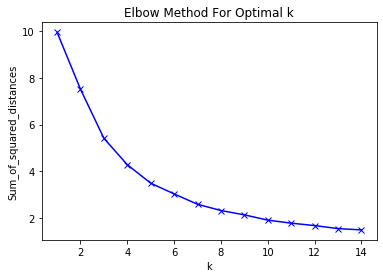

In [23]:
plt.plot(K, sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

In [24]:
kclusters = 4

kmeans_age = KMeans(
    n_clusters=kclusters, 
    random_state=0,
    init='k-means++',
).fit(age_distribution_avg)

In [25]:
age_distribution_avg['cluster'] = kmeans_age.labels_ 
age_distribution['cluster'] = kmeans_age.labels_ 

In [26]:
age_distribution_avg.groupby('cluster').mean().mul(100).round(1).astype(str) + ' %'

,Young,Student,Active,Retired
cluster,,,,
0,10.1 %,38.2 %,40.8 %,10.9 %
1,17.9 %,7.1 %,47.8 %,27.2 %
2,19.4 %,9.6 %,54.6 %,16.5 %
3,29.6 %,9.6 %,47.1 %,13.6 %


In [27]:
temp = age_distribution_avg.groupby('cluster').mean().mul(100).round(1)

In [28]:
clusters = ['Cluster ' + cluster for cluster in temp.index.astype(str).tolist()]
colors = ['rgb(80, 81, 96)', 'rgb(104, 130, 158)', 'rgb(174, 189, 56)', 'rgb(89, 130, 52)']
bars = [
    go.Bar(
        name=i, 
        x=clusters, 
        y=temp[i].tolist(),
        marker_color=colors[list(temp.columns).index(i)],
        text=temp[i].tolist(),
        textposition='auto',
    ) for i in temp.columns
]
fig = go.Figure(data=bars)
fig.update_layout(
    barmode='stack',
    xaxis_showgrid=False,
    yaxis_showgrid=False,
    paper_bgcolor='rgba(0,0,0,0)',
    plot_bgcolor='rgba(0,0,0,0)',
    yaxis = go.layout.YAxis(tickvals=[0, 50, 100], ticksuffix="%"),
    width=500,
    legend_orientation='h'
)
fig.show()

![](img/age_distribution_cluster.png)

In [29]:
cluster_colors = {0: 'rgb(104, 130, 158)', 1: 'rgb(89, 130, 52)', 2: 'rgb(174, 189, 56)', 3: 'rgb(80, 81, 96)'}
iris['Age cluster'] = iris['CODE_IRIS'].map(age_distribution_avg['cluster'].to_dict())
iris['Age cluster color'] = iris['Age cluster'].map(cluster_colors)
iris.head(2)

,INSEE_COM,NOM_COM,IRIS,CODE_IRIS,NOM_IRIS,TYP_IRIS,geometry,CITY,longitude,latitude,Age cluster,Age cluster color
0,13001,Aix-en-Provence,0105,130010105,Tanneurs,H,"POLYGON ((5.44411 43.52959, 5.44422 43.52958, ...",Aix-en-Provence,5.445513,43.528121,0.0,"rgb(104, 130, 158)"
1,13001,Aix-en-Provence,0905,130010905,Les Milles Village,H,"POLYGON ((5.37781 43.50897, 5.38100 43.50831, ...",Aix-en-Provence,5.380012,43.503931,1.0,"rgb(89, 130, 52)"


In [30]:
m = folium.Map(location=c, zoom_start=9) 

folium.GeoJson(
    iris,
    style_function=lambda feature: {
        'fillColor': feature['properties']['Age cluster color'],
        'color' : feature['properties']['Age cluster color'],
        'weight' : 1,
        'fillOpacity' : 0.8,
        }
    ).add_to(m)
m

##### We already transformed the initial dataset. We load the demographic data related to our four cities

In [31]:
csp_distribution = pd.read_excel(
    'data/demography/csp_distribution.xlsx',
    converters={'IRIS': str}
).set_index('IRIS')

In [32]:
print(csp_distribution.shape)
csp_distribution.head()

(508, 7)


,Farmers,"Craftsmen, shopkeepers, entrepreneurs","Executives, intellectual professions",Intermediate professions,Employees,Workmen,Pensioners
IRIS,,,,,,,
130010101,4.426535,66.471063,357.058180,256.548264,259.410313,96.624954,355.508350
130010102,2.976121,63.963042,338.290925,350.536777,387.266874,135.533726,231.535567
130010103,0.000000,120.440386,384.575723,306.640834,273.701987,87.152203,291.888754
130010104,0.000000,102.589263,443.823432,336.211560,366.598487,133.359544,216.566565
130010105,0.000000,83.565675,338.788316,291.023736,439.793269,100.785221,219.941431


In [33]:
condition = csp_distribution.sum(axis=1).eq(0)
csp_distribution = csp_distribution[~condition]

In [34]:
print(condition.sum())

7


In [35]:
csp_distribution_avg = csp_distribution.div(csp_distribution.sum(axis=1), axis=0).fillna(0)

In [36]:
csp_distribution_avg.describe()

,Farmers,"Craftsmen, shopkeepers, entrepreneurs","Executives, intellectual professions",Intermediate professions,Employees,Workmen,Pensioners
count,501.000000,501.000000,501.000000,501.000000,501.000000,501.000000,501.000000
mean,0.001245,0.042537,0.122912,0.164758,0.220199,0.129581,0.318767
std,0.005306,0.030499,0.085753,0.055710,0.075481,0.082690,0.089750
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.028972,0.056635,0.131367,0.168870,0.069679,0.265562
50%,0.000000,0.037959,0.104437,0.170113,0.214854,0.113512,0.322413
75%,0.000000,0.049599,0.182171,0.203566,0.268616,0.168855,0.374831
max,0.067837,0.500000,0.708644,0.400000,0.665784,0.750000,0.912099


In [37]:
cols = csp_distribution_avg.columns
colors = plotly.colors.sequential.Brwnyl
boxs = [
    go.Box(y=csp_distribution_avg[col].tolist(), name=col, marker_color=color) 
    for col, color in zip(cols, colors)
]
fig = go.Figure(data=boxs)
fig.update_layout(
    xaxis=dict(showgrid=False, zeroline=False),
    yaxis=dict(zeroline=False, gridcolor='black'),
    paper_bgcolor='rgb(255, 255, 255)',
    plot_bgcolor='rgb(255, 255, 255)',
    legend=dict(x=-.1, y=-.70),
    legend_orientation='h',
    width=500,
    height=600
)
fig.show()

![](img/professional_distribution.png)

In [38]:
sum_of_squared_distances = []
K = range(1,15)
for k in K:
    km = KMeans(n_clusters=k)
    km = km.fit(csp_distribution_avg)
    sum_of_squared_distances.append(km.inertia_)

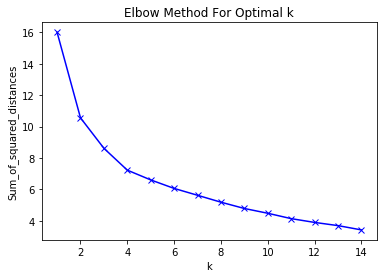

In [39]:
plt.plot(K, sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

In [40]:
kclusters = 4

kmeans_professional = KMeans(
    n_clusters=kclusters, 
    random_state=0,
    init='k-means++',
).fit(csp_distribution_avg)

In [41]:
csp_distribution_avg['cluster'] = kmeans_professional.labels_ 
csp_distribution['cluster'] = kmeans_professional.labels_ 

In [42]:
csp_distribution_avg.groupby('cluster').mean().mul(100).round(1).astype(str) + ' %'

,Farmers,"Craftsmen, shopkeepers, entrepreneurs","Executives, intellectual professions",Intermediate professions,Employees,Workmen,Pensioners
cluster,,,,,,,
0,0.1 %,5.2 %,21.8 %,21.0 %,19.4 %,8.4 %,24.1 %
1,0.1 %,4.5 %,17.1 %,17.2 %,14.7 %,6.1 %,40.3 %
2,0.0 %,3.3 %,3.4 %,9.6 %,30.0 %,26.2 %,27.5 %
3,0.2 %,3.9 %,7.4 %,16.7 %,24.8 %,14.0 %,33.0 %


In [43]:
temp = csp_distribution_avg.groupby('cluster').mean().mul(100).round(1)

In [44]:
clusters = temp.index.tolist()
colors = plotly.colors.sequential.Brwnyl
bars = [
    go.Bar(
        name=i, 
        x=clusters, 
        y=temp[i].tolist(),
        marker_color=colors[list(temp.columns).index(i)],
        text=temp[i].tolist(),
        textposition='auto',
    ) for i in temp.columns
]
fig = go.Figure(data=bars)
fig.update_layout(
    barmode='stack',
    xaxis_showgrid=False,
    yaxis_showgrid=False,
    paper_bgcolor='rgba(0,0,0,0)',
    plot_bgcolor='rgba(0,0,0,0)',
    yaxis = go.layout.YAxis(tickvals=[0, 50, 100], ticksuffix="%"),
    legend_orientation='h', 
    height=700,
    width=500
)
fig.show()

![](img/professional_distribution_cluster.png)

In [45]:
cluster_colors = {0: 'rgb(224, 194, 162)', 1: 'rgb(84, 31, 63)', 2: 'rgb(166, 84, 97)', 3: 'red'}
iris['Profession cluster'] = iris['CODE_IRIS'].map(csp_distribution_avg['cluster'].to_dict())
iris['Profession cluster color'] = iris['Profession cluster'].map(cluster_colors)
iris.sample(2)

,INSEE_COM,NOM_COM,IRIS,CODE_IRIS,NOM_IRIS,TYP_IRIS,geometry,CITY,longitude,latitude,Age cluster,Age cluster color,Profession cluster,Profession cluster color
161,13205,Marseille 5e Arrondissement,0104,132050104,Baille-Bravet,H,"POLYGON ((5.39745 43.29123, 5.39741 43.29132, ...",Marseille,5.399210,43.290586,0.0,"rgb(104, 130, 158)",0.0,"rgb(224, 194, 162)"
33,13001,Aix-en-Provence,0303,130010303,Saint-Jerome,H,"POLYGON ((5.45517 43.51469, 5.45539 43.51484, ...",Aix-en-Provence,5.457671,43.515589,0.0,"rgb(104, 130, 158)",3.0,red


In [46]:
m = folium.Map(location=c, zoom_start=9) 

folium.GeoJson(
    iris,
    style_function=lambda feature: {
        'fillColor': feature['properties']['Profession cluster color'],
        'color' : feature['properties']['Profession cluster color'],
        'weight' : 1,
        'fillOpacity' : 0.8,
        }
    ).add_to(m)
m

In [47]:
iris.head(2)

,INSEE_COM,NOM_COM,IRIS,CODE_IRIS,NOM_IRIS,TYP_IRIS,geometry,CITY,longitude,latitude,Age cluster,Age cluster color,Profession cluster,Profession cluster color
0,13001,Aix-en-Provence,0105,130010105,Tanneurs,H,"POLYGON ((5.44411 43.52959, 5.44422 43.52958, ...",Aix-en-Provence,5.445513,43.528121,0.0,"rgb(104, 130, 158)",0.0,"rgb(224, 194, 162)"
1,13001,Aix-en-Provence,0905,130010905,Les Milles Village,H,"POLYGON ((5.37781 43.50897, 5.38100 43.50831, ...",Aix-en-Provence,5.380012,43.503931,1.0,"rgb(89, 130, 52)",1.0,"rgb(84, 31, 63)"


<h3>Foursquare Facilities</h3>

In [68]:
foursquare = pd.read_excel(
    'data/foursquare/foursquare.xlsx',
    dtype={'Neighborhood': str}
)

In [69]:
print(foursquare.shape)
foursquare.sample(5)

(5157, 8)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category,Venue Family
3512,132070202,43.282732,5.350428,Porte d'Orient - Monument aux Morts de l'Armée...,43.286027,5.350374,Monument / Landmark,building
4417,132131003,43.321537,5.404110,P.M.U Les Collones,43.319996,5.409472,Brewery,food
1744,132010201,43.299484,5.382600,New Cancan,43.298156,5.383622,Nightclub,nightlife
3132,132060202,43.284160,5.388846,Kyo Sushi,43.284543,5.384486,Sushi Restaurant,food
3229,132060301,43.290804,5.384987,Subway,43.287557,5.382931,Sandwich Place,food


In [70]:
foursquare['Venue Family'].value_counts()

food                  2154
shops                  918
travel                 761
parks_outdoors         506
nightlife              368
arts_entertainment     366
building                77
event                    5
education                2
Name: Venue Family, dtype: int64

In [71]:
condition = foursquare['Venue Family'].isin(['event', 'education'])
foursquare = foursquare[~condition].reset_index(drop=True)

In [72]:
foursquare_onehot = pd.concat(
    [
        foursquare['Neighborhood'],
        pd.get_dummies(foursquare[['Venue Family']], prefix="", prefix_sep="")
    ],
    axis=1
)
print(foursquare_onehot.shape)
foursquare_onehot.head()

(5150, 8)


,Neighborhood,arts_entertainment,building,food,nightlife,parks_outdoors,shops,travel
0,130010105,0,0,0,0,1,0,0
1,130010105,0,0,1,0,0,0,0
2,130010105,0,0,1,0,0,0,0
3,130010105,0,0,0,0,1,0,0
4,130010105,0,0,1,0,0,0,0


In [73]:
foursquare_grouped = foursquare_onehot.groupby('Neighborhood').mean()
foursquare_grouped.head()

,arts_entertainment,building,food,nightlife,parks_outdoors,shops,travel
Neighborhood,,,,,,,
130010101,0.080000,0.000000,0.600000,0.080000,0.110000,0.060000,0.070000
130010102,0.035714,0.011905,0.607143,0.095238,0.119048,0.083333,0.047619
130010103,0.074627,0.000000,0.567164,0.044776,0.164179,0.104478,0.044776
130010104,0.070000,0.010000,0.570000,0.090000,0.150000,0.070000,0.040000
130010105,0.090000,0.010000,0.550000,0.080000,0.120000,0.100000,0.050000


In [74]:
foursquare_grouped.describe()

,arts_entertainment,building,food,nightlife,parks_outdoors,shops,travel
count,455.000000,455.000000,455.000000,455.000000,455.000000,455.000000,455.000000
mean,0.084253,0.024321,0.299852,0.033147,0.105684,0.280041,0.172703
std,0.156346,0.079829,0.255009,0.074962,0.166920,0.263830,0.218869
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.052174,0.000000
50%,0.000000,0.000000,0.250000,0.000000,0.000000,0.222222,0.100000
75%,0.111111,0.000000,0.500000,0.000000,0.166667,0.500000,0.250000
max,1.000000,0.500000,1.000000,0.555556,1.000000,1.000000,1.000000


In [75]:
cols = foursquare_grouped.columns
colors = plotly.colors.sequential.Brwnyl
boxs = [
    go.Box(y=foursquare_grouped[col].tolist(), name=col, marker_color=color) 
    for col, color in zip(cols, colors)
]
fig = go.Figure(data=boxs)
fig.update_layout(
    xaxis=dict(showgrid=False, zeroline=False),
    yaxis=dict(zeroline=False, gridcolor='black'),
    paper_bgcolor='rgb(255, 255, 255)',
    plot_bgcolor='rgb(255, 255, 255)',
    legend=dict(x=-.1, y=-.65),
    legend_orientation='h',
    height=600
)
fig.show()

In [76]:
sum_of_squared_distances = []
K = range(1,15)
for k in K:
    km = KMeans(n_clusters=k)
    km = km.fit(foursquare_grouped)
    sum_of_squared_distances.append(km.inertia_)

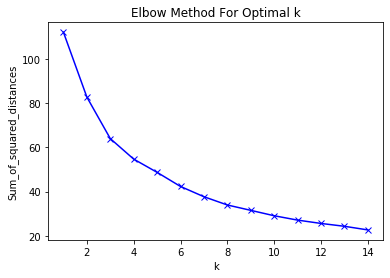

In [77]:
plt.plot(K, sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

In [78]:
kclusters = 4

kmeans_foursquare = KMeans(
    n_clusters=kclusters, 
    random_state=0,
    init='k-means++',
).fit(foursquare_grouped)

In [79]:
foursquare_grouped['cluster'] = kmeans_foursquare.labels_ 

In [80]:
foursquare_grouped.head()

,arts_entertainment,building,food,nightlife,parks_outdoors,shops,travel,cluster
Neighborhood,,,,,,,,
130010101,0.080000,0.000000,0.600000,0.080000,0.110000,0.060000,0.070000,0
130010102,0.035714,0.011905,0.607143,0.095238,0.119048,0.083333,0.047619,0
130010103,0.074627,0.000000,0.567164,0.044776,0.164179,0.104478,0.044776,0
130010104,0.070000,0.010000,0.570000,0.090000,0.150000,0.070000,0.040000,0
130010105,0.090000,0.010000,0.550000,0.080000,0.120000,0.100000,0.050000,0


In [81]:
foursquare_grouped.groupby('cluster').mean().mul(100).round(1).astype(str) + ' %'

,arts_entertainment,building,food,nightlife,parks_outdoors,shops,travel
cluster,,,,,,,
0,3.5 %,1.4 %,66.1 %,4.7 %,7.4 %,10.6 %,6.3 %
1,7.1 %,2.5 %,15.9 %,0.9 %,5.0 %,61.4 %,7.2 %
2,5.5 %,0.8 %,6.4 %,1.9 %,5.9 %,17.7 %,61.8 %
3,13.3 %,3.5 %,29.2 %,5.0 %,18.6 %,14.5 %,16.0 %


In [82]:
temp = foursquare_grouped.groupby('cluster').mean().mul(100).round(1)

In [83]:
clusters = temp.index.tolist()
colors = plotly.colors.diverging.delta
bars = [
    go.Bar(
        name=col, 
        x=clusters, 
        y=temp[col].tolist(),
        marker_color=color,
        text=temp[col].tolist(),
        textposition='auto',
    ) for col, color in zip(temp.columns, colors)
]
fig = go.Figure(data=bars)
fig.update_layout(
    barmode='stack',
    xaxis_showgrid=False,
    yaxis_showgrid=False,
    paper_bgcolor='rgba(0,0,0,0)',
    plot_bgcolor='rgba(0,0,0,0)',
    yaxis = go.layout.YAxis(tickvals=[0, 50, 100], ticksuffix="%"),
    legend_orientation='h'
)
fig.show()

![](img/foursquare_distribution_cluster.png)

In [85]:
cluster_colors = {0: 'rgb(30, 110, 161)', 1: 'rgb(18, 78, 43)', 2: 'rgb(23, 35, 18)', 3: 'rgb(16, 31, 63)'}
iris['Foursquare cluster'] = iris['CODE_IRIS'].map(foursquare_grouped['cluster'].to_dict())
iris['Foursquare cluster color'] = iris['Foursquare cluster'].map(cluster_colors)
iris.head(2)

,INSEE_COM,NOM_COM,IRIS,CODE_IRIS,NOM_IRIS,TYP_IRIS,geometry,CITY,longitude,latitude,Age cluster,Age cluster color,Profession cluster,Profession cluster color,Foursquare cluster,Foursquare cluster color
0,13001,Aix-en-Provence,0105,130010105,Tanneurs,H,"POLYGON ((5.44411 43.52959, 5.44422 43.52958, ...",Aix-en-Provence,5.445513,43.528121,0.0,"rgb(104, 130, 158)",0.0,"rgb(224, 194, 162)",0.0,"rgb(30, 110, 161)"
1,13001,Aix-en-Provence,0905,130010905,Les Milles Village,H,"POLYGON ((5.37781 43.50897, 5.38100 43.50831, ...",Aix-en-Provence,5.380012,43.503931,1.0,"rgb(89, 130, 52)",1.0,"rgb(84, 31, 63)",3.0,"rgb(16, 31, 63)"


In [86]:
m = folium.Map(location=c, zoom_start=9) 

folium.GeoJson(
    iris,
    style_function=lambda feature: {
        'fillColor': feature['properties']['Foursquare cluster color'],
        'color' : feature['properties']['Foursquare cluster color'],
        'weight' : 1,
        'fillOpacity' : 0.8,
        }
    ).add_to(m)
m

In [ ]:
829101801714